In [ ]:
from google.colab import drive
drive.mount('/content/mydrive')

Mounted at /content/mydrive


In [ ]:
path='/content/mydrive/MyDrive/Machine Learning/oasis_longitudinal.csv'
import pandas as pd

In [ ]:
data=pd.read_csv(path)

In [ ]:
data.head()

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678,0.736,1.046
3,OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1738,0.713,1.010
4,OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1698,0.701,1.034


#Converting Categorical Data to Numerical Data


In [ ]:
data['M/F'] = [1 if each == "M" else 0 for each in data['M/F']]
data['Group'] = [1 if each == "Demented" or each == "Converted" else 0 for each in data['Group']]

In [ ]:
data.head()

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,0,1,0,1,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,OAS2_0001,OAS2_0001_MR2,0,2,457,1,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,OAS2_0002,OAS2_0002_MR1,1,1,0,1,R,75,12,NaN,23.0,0.5,1678,0.736,1.046
3,OAS2_0002,OAS2_0002_MR2,1,2,560,1,R,76,12,NaN,28.0,0.5,1738,0.713,1.010
4,OAS2_0002,OAS2_0002_MR3,1,3,1895,1,R,80,12,NaN,22.0,0.5,1698,0.701,1.034


In [ ]:
data.shape

(373, 15)

In [ ]:
counted=data.groupby(["EDUC"]).size()
print(counted)

EDUC
6       3
8       9
11     11
12    103
13     27
14     33
15     17
16     81
17      9
18     64
20     13
23      3
dtype: int64


#Correlation Between Attributes

In [ ]:
correlation_matrix = data.corr()
data_corr = correlation_matrix['EDUC'].sort_values(ascending=False)
data_corr

EDUC        1.000000
eTIV        0.257015
MMSE        0.194884
M/F         0.089279
MR Delay    0.051630
Visit       0.024615
nWBV       -0.012200
Age        -0.027886
CDR        -0.153121
Group      -0.193060
ASF        -0.241752
SES        -0.722647
Name: EDUC, dtype: float64

In [ ]:
attributes = ["Group", "CDR", "M/F", "SES", "ASF"]

#Checking Missing/Null Values

In [ ]:
data.isnull().sum()

Subject ID     0
MRI ID         0
Group          0
Visit          0
MR Delay       0
M/F            0
Hand           0
Age            0
EDUC           0
SES           19
MMSE           2
CDR            0
eTIV           0
nWBV           0
ASF            0
dtype: int64

#Taking median values for the missing values of MMSE and SES

In [ ]:
median = data['MMSE'].median()
data['MMSE'].fillna(median, inplace=True)
data.isnull().sum()
median = data['SES'].median()
data['SES'].fillna(median, inplace=True)
data.isnull().sum()

Subject ID    0
MRI ID        0
Group         0
Visit         0
MR Delay      0
M/F           0
Hand          0
Age           0
EDUC          0
SES           0
MMSE          0
CDR           0
eTIV          0
nWBV          0
ASF           0
dtype: int64

In [ ]:
#finding missing values as mean
#mean = data['MMSE'].mean()
#data['MMSE'].fillna(mean, inplace=True)
#data.isnull().sum()
#mean = data['SES'].mean()
#data['SES'].fillna(mean, inplace=True)
#data.isnull().sum()

In [ ]:
data.head(100)

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,0,1,0,1,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,OAS2_0001,OAS2_0001_MR2,0,2,457,1,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,OAS2_0002,OAS2_0002_MR1,1,1,0,1,R,75,12,2.0,23.0,0.5,1678,0.736,1.046
3,OAS2_0002,OAS2_0002_MR2,1,2,560,1,R,76,12,2.0,28.0,0.5,1738,0.713,1.010
4,OAS2_0002,OAS2_0002_MR3,1,3,1895,1,R,80,12,2.0,22.0,0.5,1698,0.701,1.034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,OAS2_0047,OAS2_0047_MR1,0,1,0,0,R,77,16,2.0,29.0,0.0,1433,0.723,1.225
96,OAS2_0047,OAS2_0047_MR2,0,2,486,0,R,78,16,2.0,27.0,0.0,1414,0.727,1.242
97,OAS2_0048,OAS2_0048_MR1,1,1,0,1,R,66,16,1.0,19.0,1.0,1695,0.711,1.036
98,OAS2_0048,OAS2_0048_MR2,1,2,248,1,R,66,16,1.0,21.0,1.0,1708,0.703,1.028


In [ ]:
y = data['Group'].values
X = data[['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF']]

#Train-Test Split

In [ ]:
from sklearn.model_selection import train_test_split
# taking 80% as train and 20% as test
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, train_size= 0.80, random_state=42)

df_ytrain = pd.DataFrame(y_trainval)
df_ytest = pd.DataFrame(y_test)

print('In Training Split:')
print(df_ytrain[0].value_counts())

print('\nIn Testing Split:')
print(df_ytest[0].value_counts())

In Training Split:
0    158
1    140
Name: 0, dtype: int64

In Testing Split:
1    43
0    32
Name: 0, dtype: int64


#Scaling the data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# here StandardScaler() means z = (x - u) / s
scaler = StandardScaler().fit(X_trainval)
#scaler = MinMaxScaler().fit(X_trainval)
X_trainval_scaled = scaler.transform(X_trainval)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_trainval.describe()

,M/F,Age,EDUC,SES,MMSE,eTIV,nWBV,ASF
count,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000
mean,0.436242,76.530201,14.583893,2.453020,27.379195,1491.657718,0.730067,1.192369
std,0.496752,7.524646,2.831046,1.112891,3.607022,174.522235,0.037495,0.137086
min,0.000000,60.000000,6.000000,1.000000,7.000000,1106.000000,0.644000,0.876000
25%,0.000000,71.000000,12.000000,2.000000,27.000000,1357.250000,0.700250,1.098250
50%,0.000000,76.000000,14.500000,2.000000,29.000000,1476.000000,0.731000,1.189000
75%,1.000000,81.000000,16.000000,3.000000,30.000000,1598.500000,0.757000,1.293000
max,1.000000,98.000000,23.000000,5.000000,30.000000,2004.000000,0.837000,1.587000


In [ ]:
!pip install shap
!pip install lime
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import shap
import lime
from lime import lime_tabular
import time

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 12.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=9c004df7acd5bf303285b97a762b3fe36522cea38a8d1c64910d05d7e686fb3a
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


#SVM Linear Kernel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


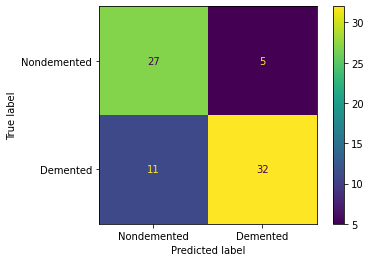

Train accuracy  0.8187919463087249
Test accuracy  0.7866666666666666
Test recall 0.7441860465116279
Test AUC 0.793968023255814


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
!pip install SVC
from sklearn.svm import SVC 
from sklearn.svm import SVC # will make a SVM for classification
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,precision_score, accuracy_score, recall_score, roc_curve, auc

shap.initjs()
svc_linear = sklearn.svm.SVC(kernel='linear', probability=True)
svc_linear.fit(X_trainval_scaled, y_trainval)
y_pred=svc_linear.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = svc_linear.score(X_trainval_scaled, y_trainval)
test_score = svc_linear.score(X_test_scaled, y_test)
y_predict = svc_linear.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# Shap Explanation
explainer = shap.KernelExplainer(svc_linear.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled)

In [ ]:
import numpy as np
from mlxtend.evaluate import mcnemar_table
tb = mcnemar_table(y_target=y_test, 
                   y_model1=y_test, 
                   y_model2=y_predict)

print(tb)

[[59  0]
 [16  0]]


In [ ]:
tb_b = np.array([[59, 0],
                 [16, 0]])
from mlxtend.evaluate import mcnemar

chi2, p = mcnemar(ary=tb_b, corrected=True)
print('chi-squared:', chi2)
print('p-value:', p)

chi-squared: 14.0625
p-value: 0.00017683457040160785


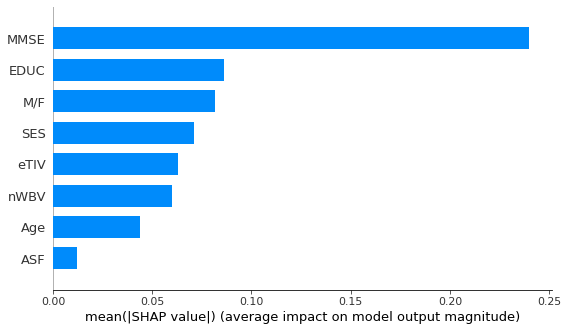

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age','EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


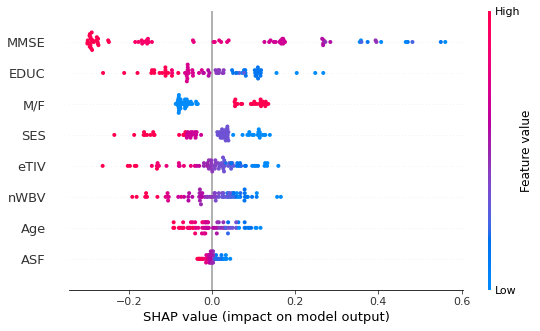

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age','EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented','Demented'],mode='classification')
exp = explainer.explain_instance(data_row=X_test_scaled[31], 
    predict_fn=svc_linear.predict_proba)
exp.show_in_notebook(show_table=True)

#SVM radial basis function kernel

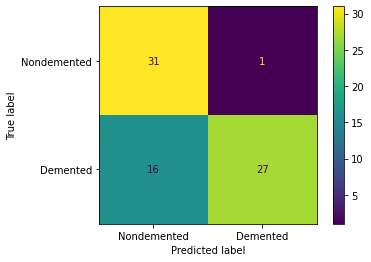

Train accuracy  0.8590604026845637
Test accuracy  0.7733333333333333
Test recall 0.627906976744186
Test AUC 0.798328488372093


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
shap.initjs()
svc_rbf = sklearn.svm.SVC(kernel='rbf', probability=True)
svc_rbf.fit(X_trainval_scaled, y_trainval)

y_pred=svc_rbf.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = svc_rbf.score(X_trainval_scaled, y_trainval)
test_score = svc_rbf.score(X_test_scaled, y_test)
y_predict = svc_rbf.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# explain all the predictions in the test set
explainer = shap.KernelExplainer(svc_rbf.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


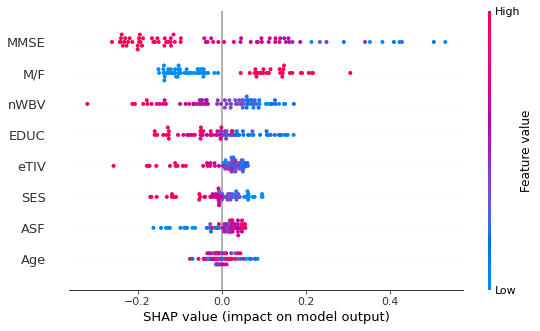

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

In [ ]:
import numpy as np
from mlxtend.evaluate import mcnemar_table
tb = mcnemar_table(y_target=y_test, 
                   y_model1=y_test, 
                   y_model2=y_predict)

print(tb)

[[58  0]
 [17  0]]


In [ ]:
tb_b = np.array([[58, 0],
                 [17, 0]])
from mlxtend.evaluate import mcnemar

chi2, p = mcnemar(ary=tb_b, corrected=True)
print('chi-squared:', chi2)
print('p-value:', p)

chi-squared: 15.058823529411764
p-value: 0.00010421194515808901


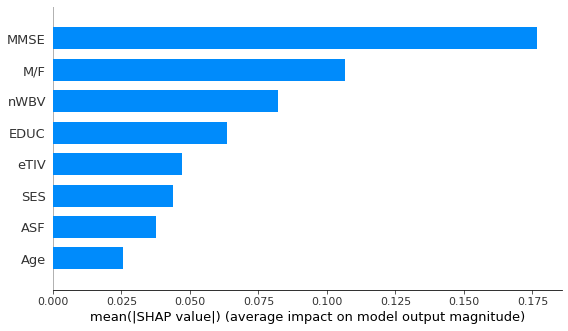

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type='bar')

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented', 'Demented'],
    mode='classification')
exp = explainer.explain_instance(
    data_row=X_test_scaled[31], 
    predict_fn=svc_rbf.predict_proba)
exp.show_in_notebook(show_table=True)

#KNN

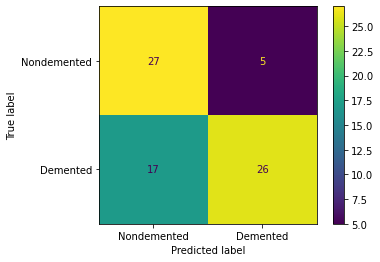

Train accuracy  0.87248322147651
Test accuracy  0.7066666666666667
Test recall 0.6046511627906976
Test AUC 0.7242005813953488


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
shap.initjs()
knn = sklearn.neighbors.KNeighborsClassifier()
knn.fit(X_trainval_scaled, y_trainval)
y_pred=knn.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = knn.score(X_trainval_scaled, y_trainval)
test_score = knn.score(X_test_scaled, y_test)
y_predict = knn.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# explain all the predictions in the test set
explainer = shap.KernelExplainer(knn.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


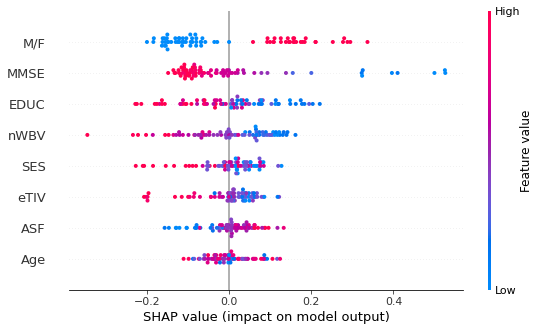

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

In [ ]:
import numpy as np
from mlxtend.evaluate import mcnemar_table
tb = mcnemar_table(y_target=y_test, 
                   y_model1=y_test, 
                   y_model2=y_predict)

print(tb)

[[53  0]
 [22  0]]


In [ ]:
tb_b = np.array([[53, 0],
                 [22, 0]])
from mlxtend.evaluate import mcnemar

chi2, p = mcnemar(ary=tb_b, corrected=True)
print('chi-squared:', chi2)
print('p-value:', p)

chi-squared: 20.045454545454547
p-value: 7.562306614504704e-06


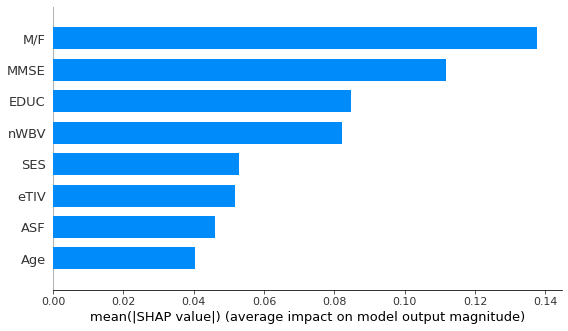

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type='bar')

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented', 'Demented'],
    mode='classification')
exp = explainer.explain_instance(
    data_row=X_test_scaled[31], 
    predict_fn=knn.predict_proba)
exp.show_in_notebook(show_table=True)

#Random Forest

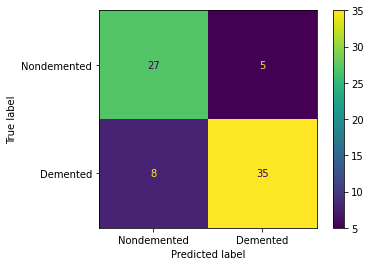

Train accuracy  1.0
Test accuracy  0.8266666666666667
Test recall 0.813953488372093
Test AUC 0.8288517441860466


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
from sklearn.ensemble import RandomForestClassifier

shap.initjs()
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_trainval_scaled, y_trainval)
y_pred=rfc.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = rfc.score(X_trainval_scaled, y_trainval)
test_score = rfc.score(X_test_scaled, y_test)
y_predict = rfc.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# explain all the predictions in the test set
explainer = shap.KernelExplainer(rfc.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


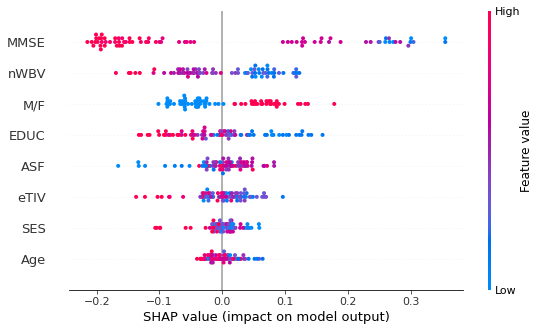

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

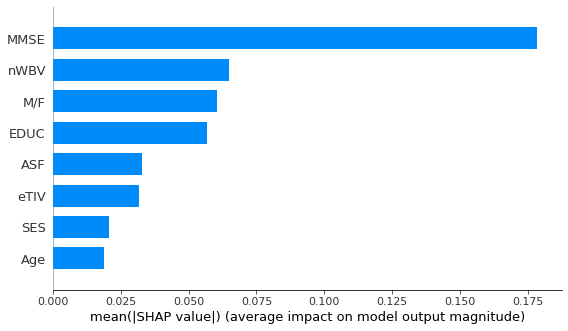

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type='bar')

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented', 'Demented'],
    mode='classification')
exp = explainer.explain_instance(
    data_row=X_test_scaled[31], 
    predict_fn=rfc.predict_proba)
exp.show_in_notebook(show_table=True)

#Logistic regression

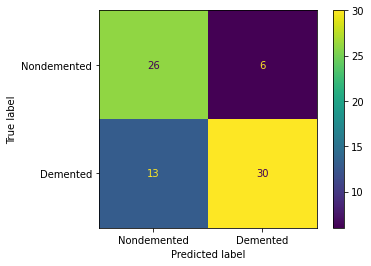

Train accuracy  0.8087248322147651
Test accuracy  0.7466666666666667
Test recall 0.6976744186046512
Test AUC 0.7550872093023255


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
shap.initjs()
linear_lr = sklearn.linear_model.LogisticRegression()
linear_lr.fit(X_trainval_scaled, y_trainval)

y_pred=linear_lr.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = linear_lr.score(X_trainval_scaled, y_trainval)
test_score = linear_lr.score(X_test_scaled, y_test)
y_predict = linear_lr.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# explain all the predictions in the test set
explainer = shap.KernelExplainer(linear_lr.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

In [ ]:
import numpy as np
from mlxtend.evaluate import mcnemar_table
tb = mcnemar_table(y_target=y_test, 
                   y_model1=y_test, 
                   y_model2=y_predict)

print(tb)

[[56  0]
 [19  0]]


In [ ]:
tb_b = np.array([[56, 0],
                 [19, 0]])
from mlxtend.evaluate import mcnemar

chi2, p = mcnemar(ary=tb_b, corrected=True)
print('chi-squared:', chi2)
print('p-value:', p)

chi-squared: 17.05263157894737
p-value: 3.635795520299535e-05


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


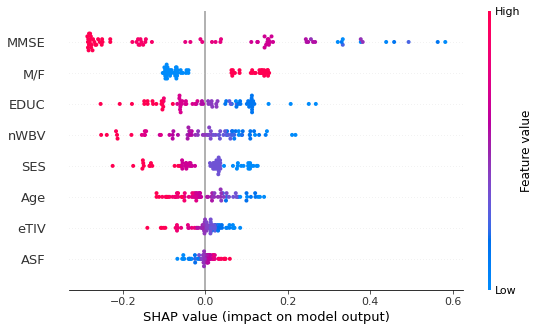

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

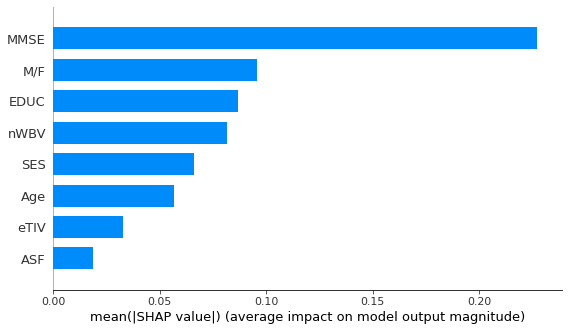

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type='bar')

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented', 'Demented'],
    mode='classification')
exp = explainer.explain_instance(
    data_row=X_test_scaled[31], 
    predict_fn=linear_lr.predict_proba)
exp.show_in_notebook(show_table=True)

#Decision Tree


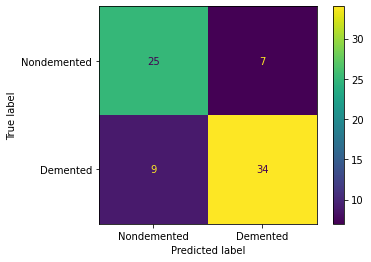

Train accuracy  1.0
Test accuracy  0.7866666666666666
Test recall 0.7906976744186046
Test AUC 0.7859738372093024


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
shap.initjs()
import sklearn.tree
dtree = sklearn.tree.DecisionTreeClassifier(min_samples_split=2)
dtree.fit(X_trainval_scaled, y_trainval)

y_pred=dtree.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = dtree.score(X_trainval_scaled, y_trainval)
test_score = dtree.score(X_test_scaled, y_test)
y_predict = dtree.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# explain all the predictions in the test set
explainer = shap.KernelExplainer(dtree.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

In [ ]:
import numpy as np
from mlxtend.evaluate import mcnemar_table
tb = mcnemar_table(y_target=y_test, 
                   y_model1=y_test, 
                   y_model2=y_predict)

print(tb)

[[59  0]
 [16  0]]


In [ ]:
tb_b = np.array([[59, 0],
                 [16, 0]])
from mlxtend.evaluate import mcnemar

chi2, p = mcnemar(ary=tb_b, corrected=True)
print('chi-squared:', chi2)
print('p-value:', p)

chi-squared: 14.0625
p-value: 0.00017683457040160785


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


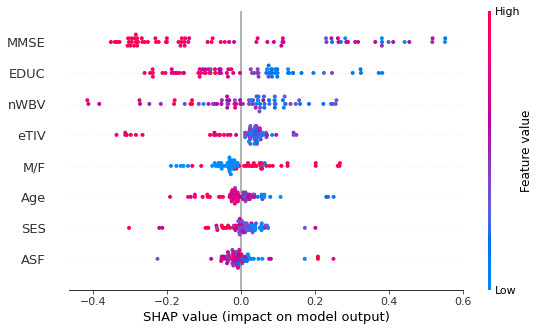

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

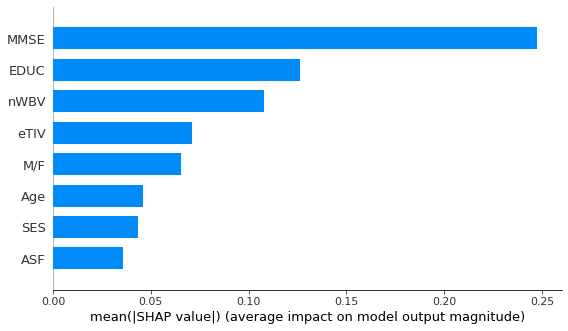

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type='bar')

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented', 'Demented'],
    mode='classification')
exp = explainer.explain_instance(
    data_row=X_test_scaled[31], 
    predict_fn=dtree.predict_proba)
exp.show_in_notebook(show_table=True)

#Neural Network

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html


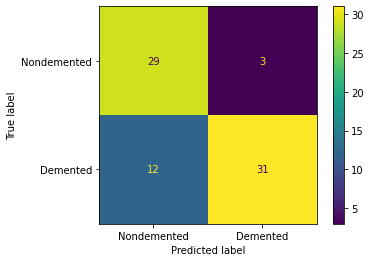

Train accuracy  0.912751677852349
Test accuracy  0.8
Test recall 0.7209302325581395
Test AUC 0.8135901162790697


  0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
shap.initjs()
from sklearn.neural_network import MLPClassifier
nn = MLPClassifier(solver='lbfgs', alpha=1e-3, hidden_layer_sizes=(5, 2), random_state=0)
nn.fit(X_trainval_scaled, y_trainval)

y_pred=nn.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Nondemented', 'Demented'])
disp.plot()
plt.show()

train_score = nn.score(X_trainval_scaled, y_trainval)
test_score = nn.score(X_test_scaled, y_test)
y_predict = nn.predict(X_test_scaled)
test_recall = recall_score(y_test, y_predict)
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
test_auc = auc(fpr, tpr)
print("Train accuracy ", train_score)
print("Test accuracy ", test_score)
print("Test recall", test_recall)
print("Test AUC", test_auc)

# explain all the predictions in the test set
explainer = shap.KernelExplainer(nn.predict_proba, X_test_scaled)
shap_values = explainer.shap_values(X_test_scaled)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

In [ ]:
import numpy as np
from mlxtend.evaluate import mcnemar_table
tb = mcnemar_table(y_target=y_test, 
                   y_model1=y_test, 
                   y_model2=y_predict)

print(tb)

[[60  0]
 [15  0]]


In [ ]:
tb_b = np.array([[60, 0],
                 [15, 0]])
from mlxtend.evaluate import mcnemar

chi2, p = mcnemar(ary=tb_b, corrected=True)
print('chi-squared:', chi2)
print('p-value:', p)

chi-squared: 13.066666666666666
p-value: 0.00030059760744045053


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


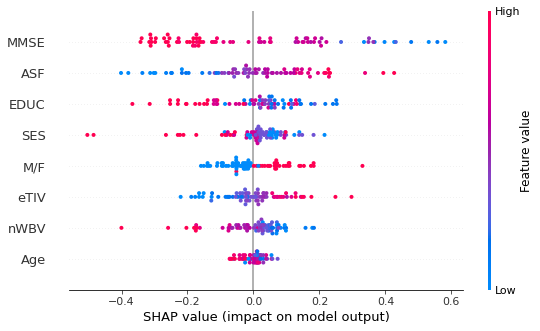

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'])

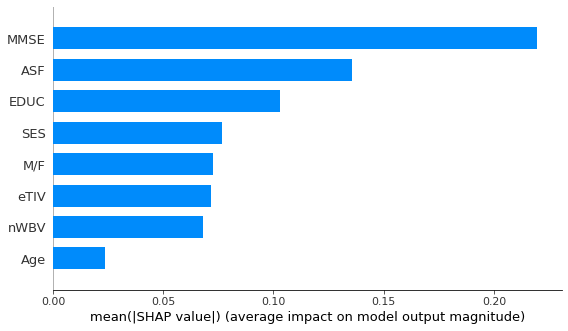

In [ ]:
#summary of SHAP
shap.summary_plot(shap_values[1],X_test_scaled,feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],plot_type='bar')

In [ ]:
#Lime Explanation
shap.initjs()
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_trainval_scaled),
    feature_names=['M/F', 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF'],
    class_names=['Nondemented', 'Demented'],
    mode='classification')
exp = explainer.explain_instance(
    data_row=X_test_scaled[31], 
    predict_fn=nn.predict_proba)
exp.show_in_notebook(show_table=True)

Libraries required to use keras

In [ ]:
#Import libraries that will allow you to use keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, GRU
from keras import metrics
!pip install keras-metrics #It doesn't come with Google Colab
import keras_metrics as km #when compiling
import keras
import numpy as np
from numpy import array

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
